## Dependencies

In [1]:
import os
import re
import io
import gc
import pandas as pd
import seaborn as sns
import numpy as np
import pickle as pk
import cv2 as cv
import plotly.express as px
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import skimage.exposure as exposure
from PIL import Image
from sklearn.utils import shuffle
from sklearn import decomposition
from skimage.restoration import estimate_sigma
from scipy import stats
from skimage.filters import difference_of_gaussians, window
from matplotlib.offsetbox import OffsetImage, AnnotationBbox, TextArea
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler

## Data exploration and visualisation

#### Class distribution

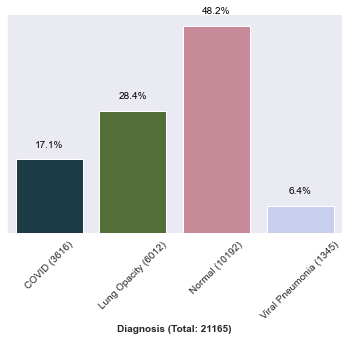

In [2]:
DATA_DIRECTORY = './input/data/'
ANALYSIS_DIRECTORY = './analysis/'

sns.set_style('dark')

# Read classes and image counts from file
ddx = { }
for fdir, _, filenames in os.walk(DATA_DIRECTORY):
  diagnosis = re.sub(DATA_DIRECTORY, '', fdir)
  if len(diagnosis) > 0:
    ddx[diagnosis] = [len(filenames), filenames]

ddx = pd.DataFrame.from_dict(ddx, orient='index').reset_index()
ddx.columns = ['Diagnosis', 'Count', 'Files']

# Plot distribution of classes
totalSamples = sum(ddx['Count'])

ax = sns.barplot(data=ddx, x='Diagnosis', y='Count', order=ddx['Diagnosis'].value_counts().index, palette='cubehelix')
sns.despine(top=True, right=True, left=False, bottom=False)
ax.set_xlabel(f'Diagnosis (Total: {totalSamples})', weight='bold')
ax.set_xticklabels(
  map(lambda args: f"{args[1]} ({ddx['Count'][args[0]]})", enumerate(ddx['Diagnosis'])),
  rotation=45
)
ax.set_yticklabels([])
ax.axes.get_yaxis().set_visible(False)

for p in ax.patches:
  ax.annotate(
    '%.1f%%' % (100*float(p.get_height()/totalSamples)),
    (p.get_x() + p.get_width() / 2., abs(p.get_height())),
    ha='center', va='bottom', color='black', xytext=(0, 10), textcoords='offset points'
  )

#### Image characteristics

{'COVID': {'.png': {'min': (299, 299), 'max': (299, 299)}}, 'Lung Opacity': {'.png': {'min': (299, 299), 'max': (299, 299)}}, 'Normal': {'.png': {'min': (299, 299), 'max': (299, 299)}}, 'Viral Pneumonia': {'.png': {'min': (299, 299), 'max': (299, 299)}}}


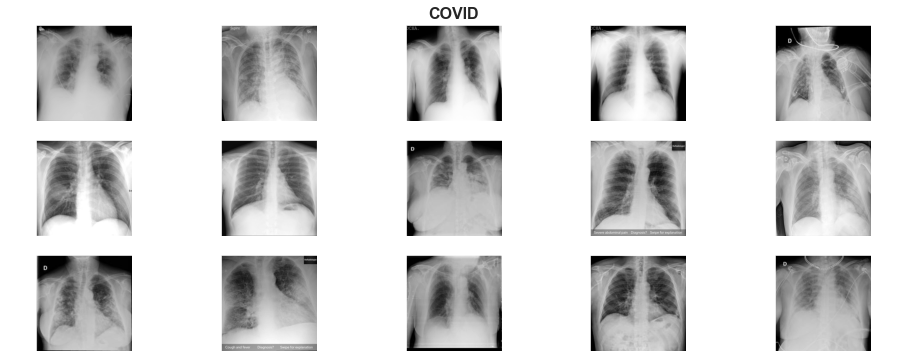

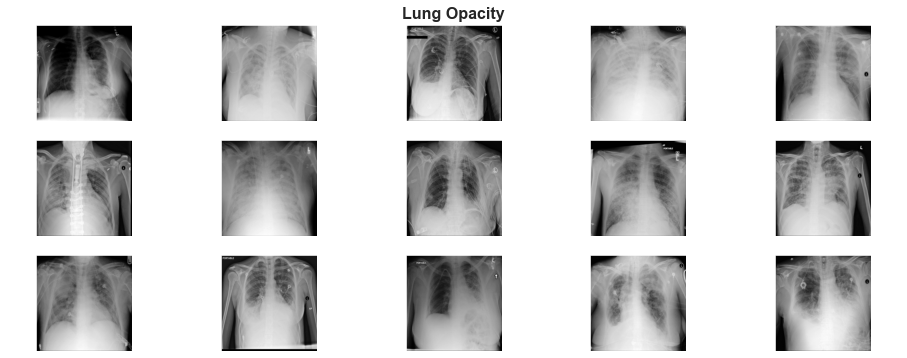

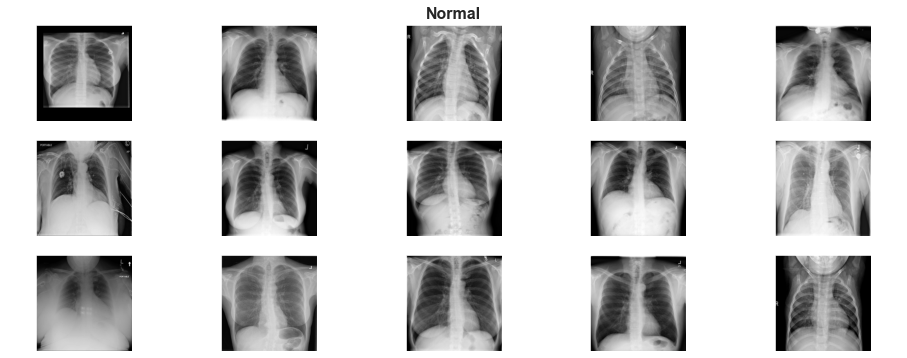

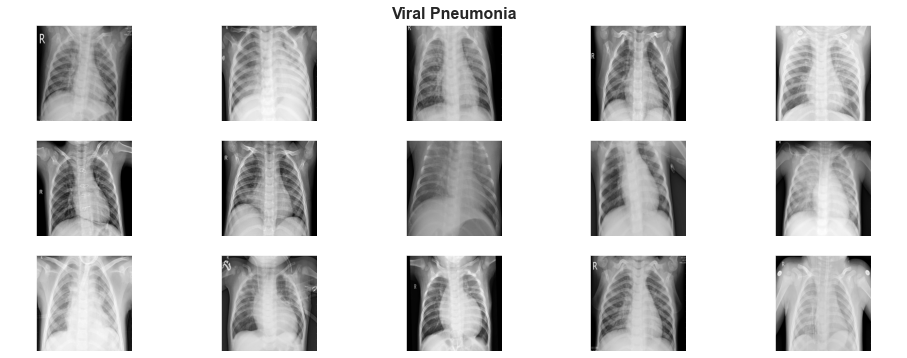

In [3]:
datasetInfo = { }
for i, files in enumerate(ddx['Files']):
  diagnosis = ddx['Diagnosis'][i]

  shuffled = shuffle(files)
  fig = plt.figure(figsize=(16, 6))
  plt.title(diagnosis, fontsize=16, weight='bold')
  sns.despine(top=True, right=True, left=True, bottom=True)
  plt.axis('off')

  # Confirm sizes of images in each class & extensions
  fileBreakdown = { }
  for file in files:
    ext = os.path.splitext(file)[1]
    
    if not ext in fileBreakdown:
      fileBreakdown[ext] = []

    path = f"{DATA_DIRECTORY}/{diagnosis}/{file}"
    with open(path, mode='rb') as input:
      data = input.read(60)
      img = Image.open(io.BytesIO(data))
      if not fileBreakdown[ext]:
        fileBreakdown[ext] = {'min': None, 'max': None}
      fileBreakdown[ext]['min'] = min(img.size, fileBreakdown[ext]['min']) if fileBreakdown[ext]['min'] else img.size
      fileBreakdown[ext]['max'] = max(img.size, fileBreakdown[ext]['max']) if fileBreakdown[ext]['max'] else img.size

  datasetInfo[diagnosis] = fileBreakdown

  # Visualise subset of each class
  for j in range(15):
    ax = fig.add_subplot(3, 5, j + 1, xticks=[], yticks=[])
    ax.imshow(mpimg.imread(f"{DATA_DIRECTORY}/{diagnosis}/{files[j]}"), cmap=plt.cm.gray)

print(datasetInfo)

#### Gathering our data

In [4]:
wh = 128 # Resize width/height for images, represents both w and h - lower res will reduce computational time
nC = 30  # Number of PCA components

# Read or estimate sigma
computedNoise = 0
def getNoise(path, img):
  global computedNoise
  if type(computedNoise) == type(0):
    noiseFile = ANALYSIS_DIRECTORY + '/noise/computedNoise.csv'
    if os.path.isfile(noiseFile):
      computedNoise = pd.read_csv(noiseFile)
    else:
      computedNoise = False
  
  if isinstance(computedNoise, pd.DataFrame):
    noise = computedNoise[computedNoise['img'] == path]['noise'].iloc[0]
    return noise if noise else estimate_sigma(img)
  
  return estimate_sigma(img)

pcaData = []
imageData = []
for i, files in enumerate(ddx['Files']):
  diagnosis = ddx['Diagnosis'][i]

  pcap = f"{ANALYSIS_DIRECTORY}/pca/{diagnosis}"
  path = f"{DATA_DIRECTORY}/{diagnosis}/"
  images = pd.DataFrame([])
  
  hasPkl = os.path.isfile(f"{pcap}/pca.pkl")
  for file in files:
    # Read and grayscale images
    filename = path + file
    img = Image.open(path + file).resize((wh, wh), Image.ANTIALIAS).convert('L')
    img = np.asarray(img)

    # Estimate noise of image (or get from .csv)
    noise = getNoise(filename, img)
    
    # Append image data
    imageData.append({'dx': diagnosis, 'img': filename, 'noise': noise, 'max': np.max(img), 'min': np.min(img), 'med': np.median(img), 'mean': np.mean(img), 'std': np.std(img, ddof=1)})

    # Resize image, flatten and append for PCA
    #img = cv.resize(img, (wh, wh), interpolation=cv.INTER_AREA)
    img = pd.Series(img.flatten(), name=file)
    
    if not hasPkl:
      images = images.append(img)
  
  # PCA (or get images from prev. computation)
  os.makedirs(pcap, exist_ok=True)
  
  pca = None
  if not hasPkl:
    pca = decomposition.PCA(n_components=100)
    pca.fit(images)

    # dump pca
    pk.dump(pca, open(f"{pcap}/pca.pkl", 'wb'))
  else:
    # load pca
    pca = pk.load(open(f"{pcap}/pca.pkl", 'rb'))
  
  pcaData.append({'dx': diagnosis, 'pca': pca})

# To pandas df
imgDf = pd.DataFrame.from_dict(imageData)
pcaDf = pd.DataFrame.from_dict(pcaData)

del pcaData
del imageData
del datasetInfo
gc.collect()

# Save sigma for future
if not isinstance(computedNoise, pd.DataFrame):
  noiseDf = imgDf[['img', 'noise']]
  noiseDf.to_csv(ANALYSIS_DIRECTORY + '/noise/computedNoise.csv', index=False)

#### Exploring brightness

Text(0.5, 1.0, 'Mean vs StdDev of brightness by diagnosis (dx)')

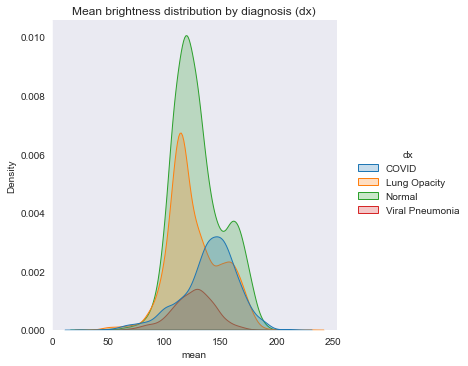

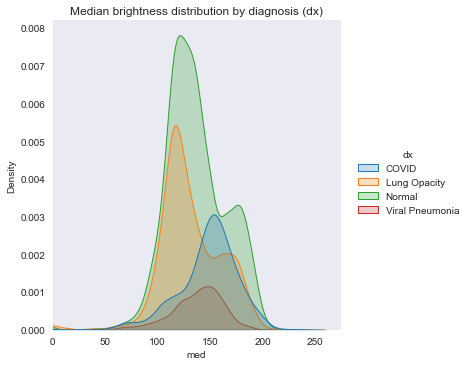

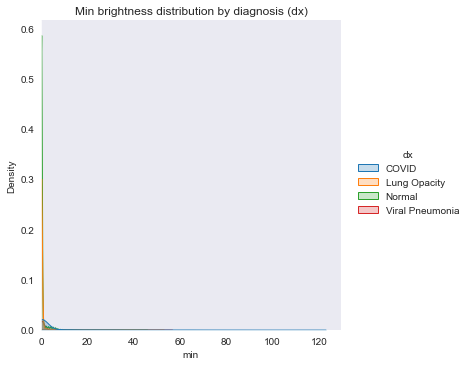

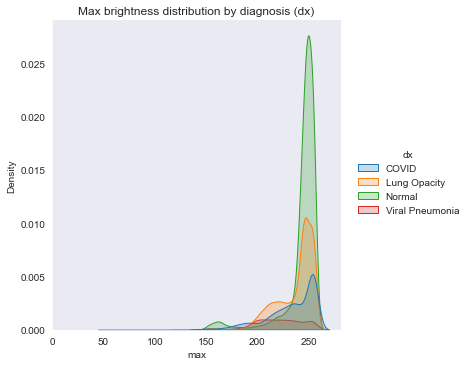

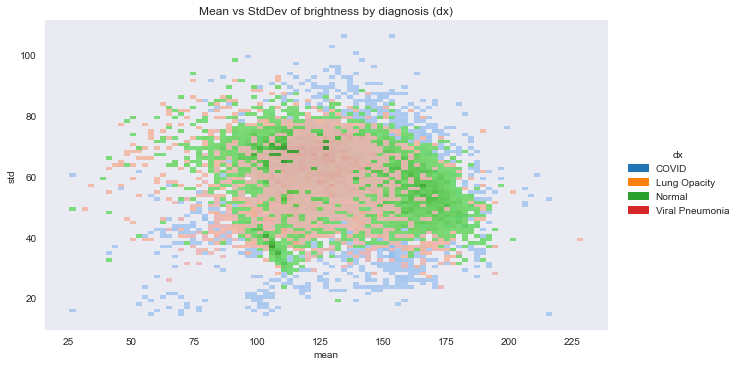

In [5]:
# mapped to signed int8, needs casting to u_int8
imgDf['max'] = imgDf['max'].astype('uint8')

# Set plot sizes and aspect ratio
pHeight = 5; aspRatio = 1/1

# Plot mean brightness distribution by class
sns.displot(imgDf, x='mean', hue='dx', kind='kde', fill=True, height=pHeight, aspect=aspRatio).set(xlim=(0))
plt.title('Mean brightness distribution by diagnosis (dx)')

# Plot median brightness distribution by class
sns.displot(imgDf, x='med', hue='dx', kind='kde', fill=True, height=pHeight, aspect=aspRatio).set(xlim=(0))
plt.title('Median brightness distribution by diagnosis (dx)')

# Plot min/max brightness by class
sns.displot(imgDf, x='min', hue='dx', kind='kde', fill=True, height=pHeight, aspect=aspRatio).set(xlim=(0))
plt.title('Min brightness distribution by diagnosis (dx)')

sns.displot(imgDf, x='max', hue='dx', kind='kde', fill=True, height=pHeight, aspect=aspRatio).set(xlim=(0))
plt.title('Max brightness distribution by diagnosis (dx)')

# Mean and standard deviation of brightess by class
sns.displot(x='mean', y='std', hue='dx', data=imgDf, legend='full', alpha=0.9, height=pHeight, aspect=1.75)
plt.title('Mean vs StdDev of brightness by diagnosis (dx)')

#### Brightness outliers

25


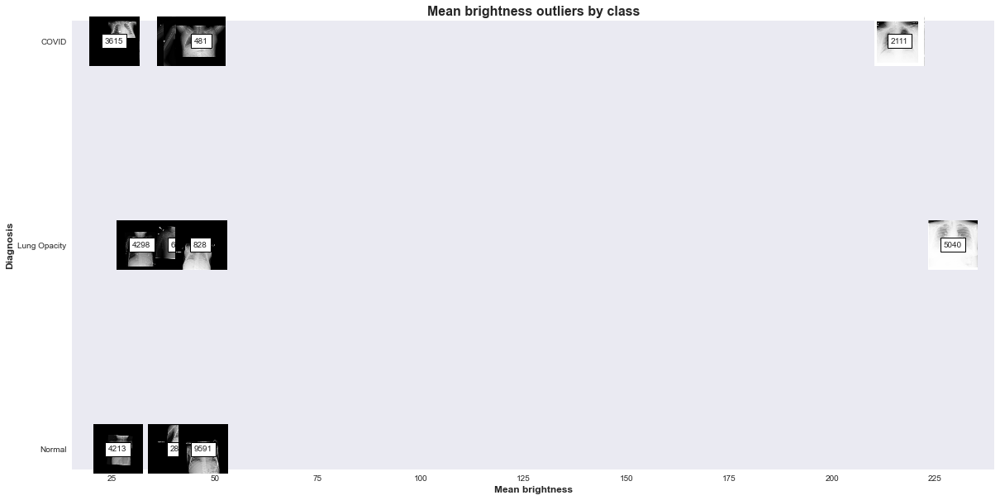

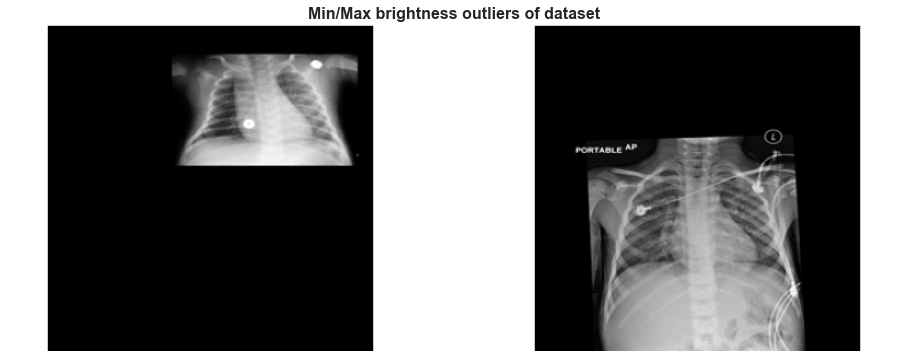

In [6]:
# Visualise outliers of each class
zThreshold = 3.5

imgDf['zScore'] = np.abs(stats.zscore(imgDf['mean'], ddof=0))
outliers = imgDf.loc[imgDf['zScore'] > zThreshold].reset_index(drop=True)
print(len(outliers))

fig, ax = plt.subplots(figsize=(20,10))
sns.scatterplot(data=outliers, x='mean', y='dx')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.title('Mean brightness outliers by class', fontsize=16, weight='bold')
ax.set_xlabel('Mean brightness', fontsize=12, weight='bold')
ax.set_ylabel('Diagnosis',fontsize=12, weight='bold')

for mean, dx, img in zip(outliers['mean'], outliers['dx'], outliers['img']):
  spl = re.findall(r'\d+', img)[0]
  ax.add_artist(AnnotationBbox(OffsetImage(cv.imread(img, 0), zoom=0.2, cmap=plt.cm.gray), (mean, dx), frameon=False))
  ax.add_artist(AnnotationBbox(TextArea(spl), (mean, dx)))

# Show min/max of outliers
fig = plt.figure(figsize=(16, 6))
plt.title('Min/Max brightness outliers of dataset', fontsize=16, weight='bold')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.axis('off')

mmOutlier = outliers[(outliers['zScore'] == outliers['zScore'].max()) | (outliers['zScore'] == outliers['zScore'].min())].reset_index(drop=True)
for i, row in mmOutlier.iterrows():
  ax = fig.add_subplot(1, 2, i + 1, xticks=[], yticks=[])
  ax.imshow(mpimg.imread(row['img']), cmap=plt.cm.gray)

#### Exploring noise and outliers

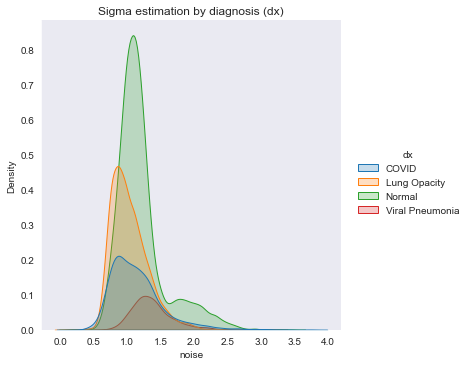

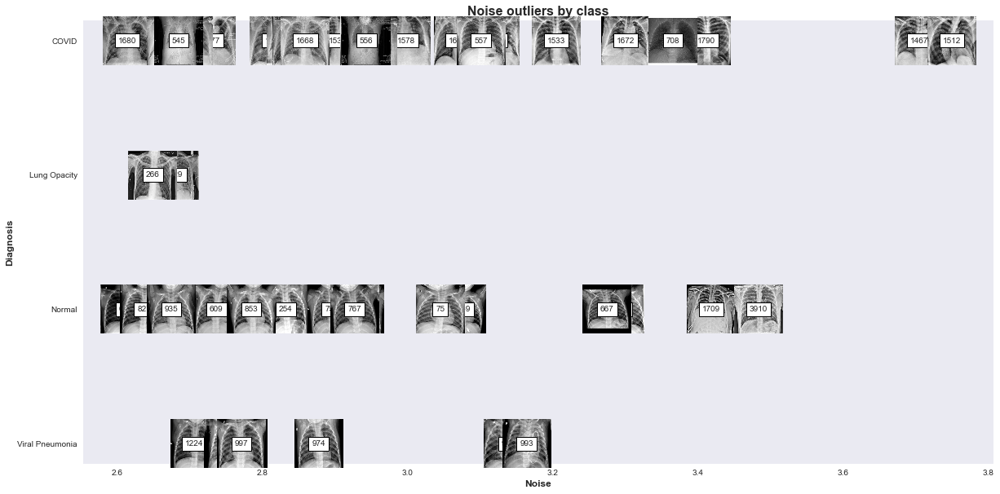

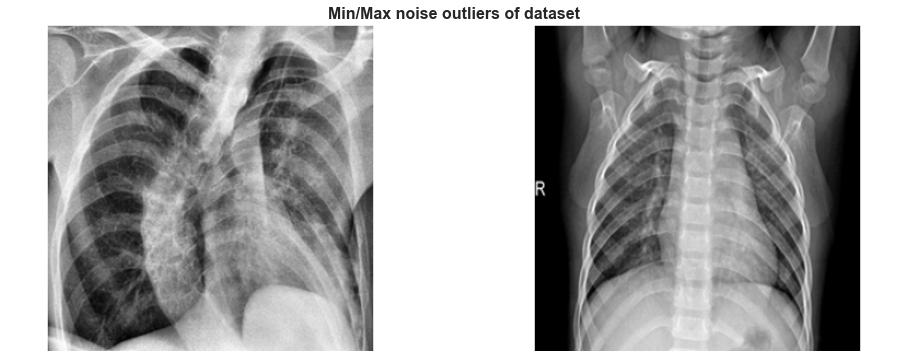

In [7]:
# Plot noise distribution by class
sns.displot(imgDf, x='noise', hue='dx', kind='kde', fill=True, height=pHeight, aspect=aspRatio)
plt.title('Sigma estimation by diagnosis (dx)')

# Visualise outliers of each class
zThreshold = 4

imgDf['zScore'] = np.abs(stats.zscore(imgDf['noise'], ddof=0))
outliers = imgDf.loc[imgDf['zScore'] > zThreshold]

fig, ax = plt.subplots(figsize=(20,10))
sns.scatterplot(data=outliers, x='noise', y='dx')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.title('Noise outliers by class', fontsize=16, weight='bold')
ax.set_xlabel('Noise', fontsize=12, weight='bold')
ax.set_ylabel('Diagnosis',fontsize=12, weight='bold')

for noise, dx, img in zip(outliers['noise'], outliers['dx'], outliers['img']):
    spl = re.findall(r'\d+', img)[0]
    ax.add_artist(AnnotationBbox(OffsetImage(cv.imread(img, 0), zoom=0.2, cmap=plt.cm.gray), (noise, dx), frameon=False))
    ax.add_artist(AnnotationBbox(TextArea(spl), (noise, dx)))

# Show min/max of outliers
fig = plt.figure(figsize=(16, 6))
plt.title('Min/Max noise outliers of dataset', fontsize=16, weight='bold')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.axis('off')

mmOutlier = outliers[(outliers['zScore'] == outliers['zScore'].max()) | (outliers['zScore'] == outliers['zScore'].min())].reset_index(drop=True)
for i, row in mmOutlier.iterrows():
  ax = fig.add_subplot(1, 2, i + 1, xticks=[], yticks=[])
  ax.imshow(mpimg.imread(row['img']), cmap=plt.cm.gray)

#### Principal Component Analysis

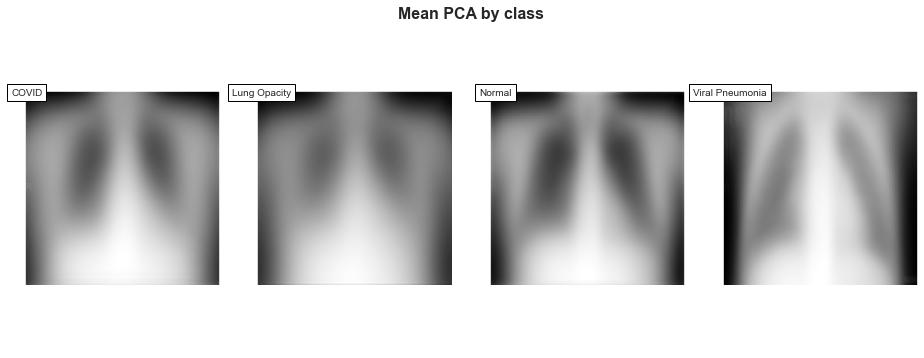

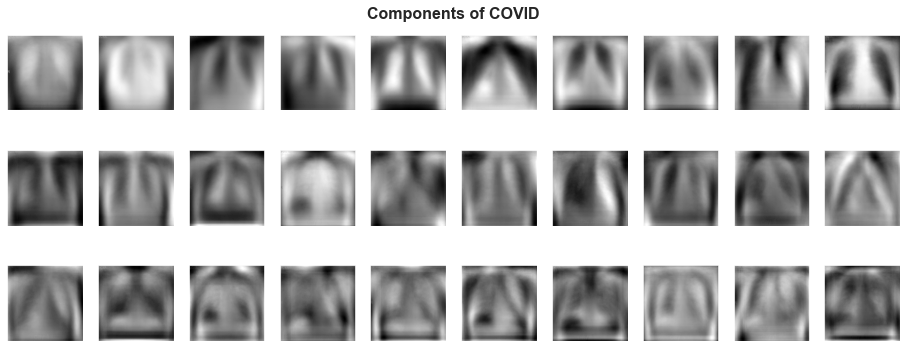

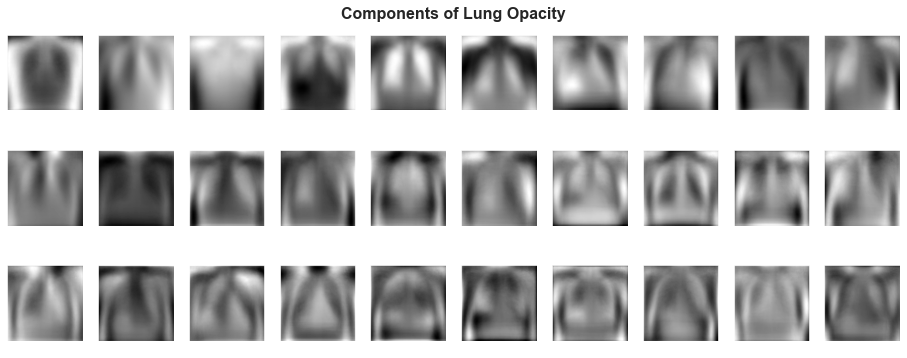

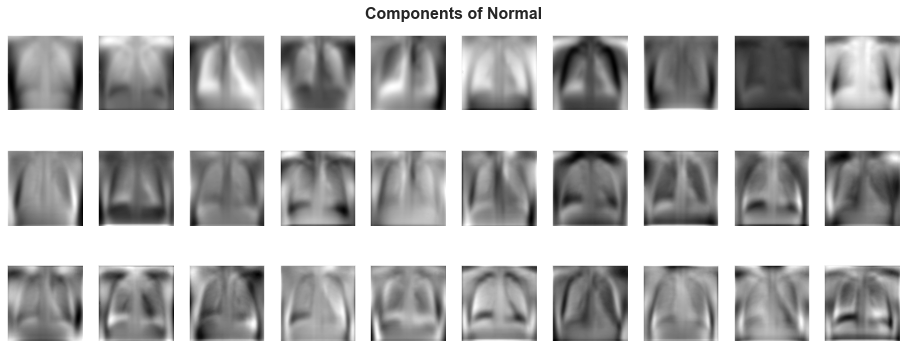

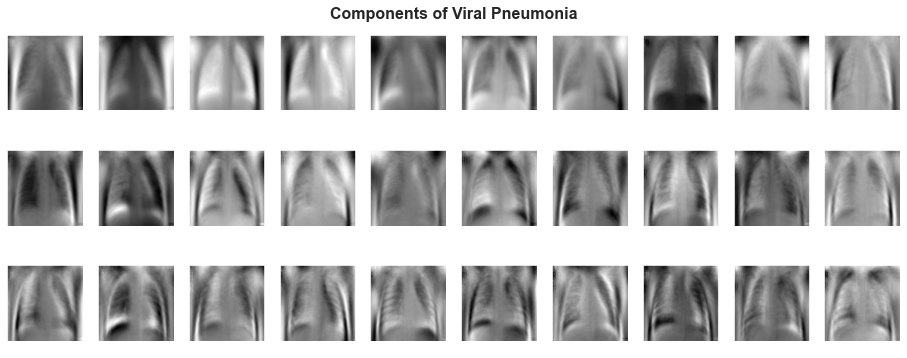

In [8]:
# Visualise mean PCA of each class
mFig = plt.figure(figsize=(16, 6))
plt.title('Mean PCA by class', fontsize=16, weight='bold')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.axis('off')
for i, row in pcaDf.iterrows():
  pca = row['pca']

  # Visualise mean of each class
  ax = mFig.add_subplot(1, 4, i + 1, xticks=[], yticks=[])
  ax.imshow(pca.mean_.reshape(wh, wh), cmap=plt.cm.gray)
  ax.add_artist(AnnotationBbox(TextArea(row['dx']), (i + 1, 1)))

  # Visualise sample of principal components
  cFig = plt.figure(figsize=(16, 6))
  plt.title(f"Components of {row['dx']}", fontsize=16, weight='bold')
  sns.despine(top=True, right=True, left=True, bottom=True)
  plt.axis('off')
  
  for j in range(30):      
    ax = cFig.add_subplot(3, 10, j + 1, xticks=[], yticks=[])
    ax.imshow(pca.components_[j].reshape(wh, wh), cmap=plt.cm.gray)

#### Fourier Transformation

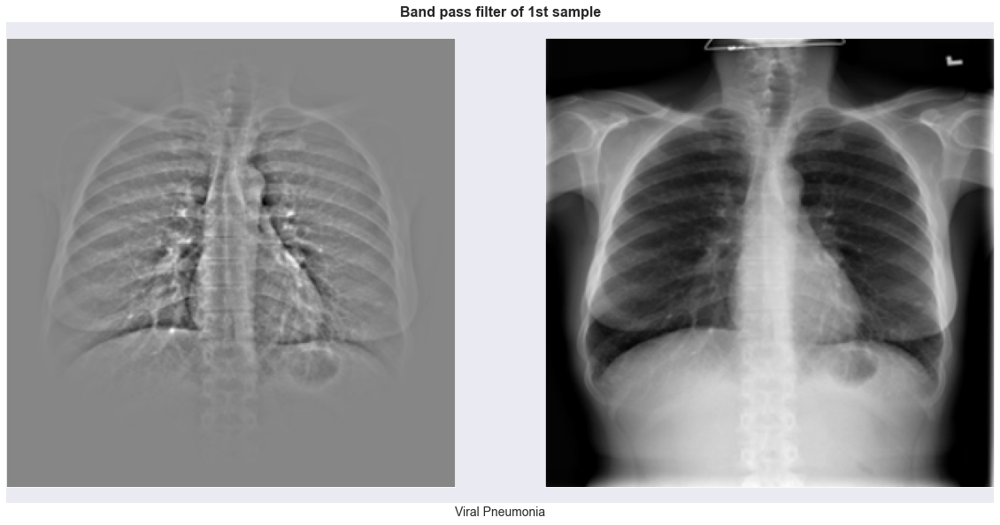

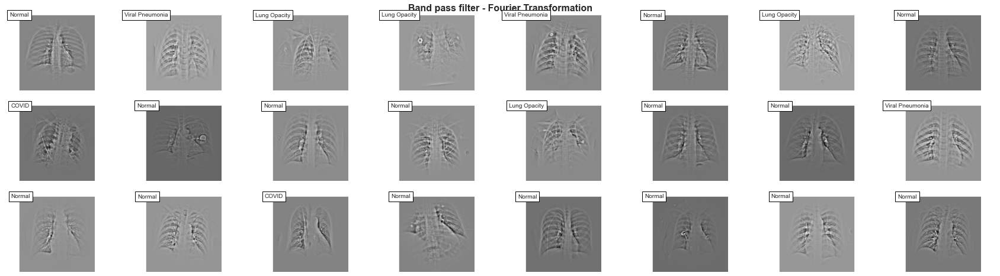

In [9]:
# Sample fraction of dataset
sampleDf = imgDf.sample(n=24, replace=False, random_state=1).reset_index(drop=True)

# BPF Fourier transformation
lowSigma = 0.2
highSigma = 5
def applyBPF(img):
  return difference_of_gaussians(img, lowSigma, highSigma) * window('hann', img.shape)

# Plot first sample for comparison
img = np.asarray(Image.open(sampleDf.iloc[0]['img']).convert('L'))
filtered = applyBPF(img)
fig = plt.figure(figsize=(20, 10))
plt.title('Band pass filter of 1st sample', fontsize=16, weight='bold')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.xlabel(dx, fontsize=14)
plt.xticks([])
plt.yticks([])
ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
ax.imshow(filtered, cmap=plt.cm.gray)
ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
ax.imshow(img, cmap=plt.cm.gray)

# Plot our samples
fig = plt.figure(figsize=(30, 8))
plt.title('Band pass filter - Fourier Transformation', fontsize=16, weight='bold')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.axis('off')
for i, row in sampleDf.iterrows():
  img = Image.open(row['img']).convert('L')
  img = np.asarray(img)

  # Band pass filter
  filtered = applyBPF(img)
  ax = fig.add_subplot(3, 8, i + 1, xticks=[], yticks=[])
  ax.imshow(filtered, cmap=plt.cm.gray)
  ax.add_artist(AnnotationBbox(TextArea(row['dx']), (i / 3, i % 3)))

#### HOG features and dimensionality reduction

(720,)


Text(0, 0.5, 'Cumulative explained variance')

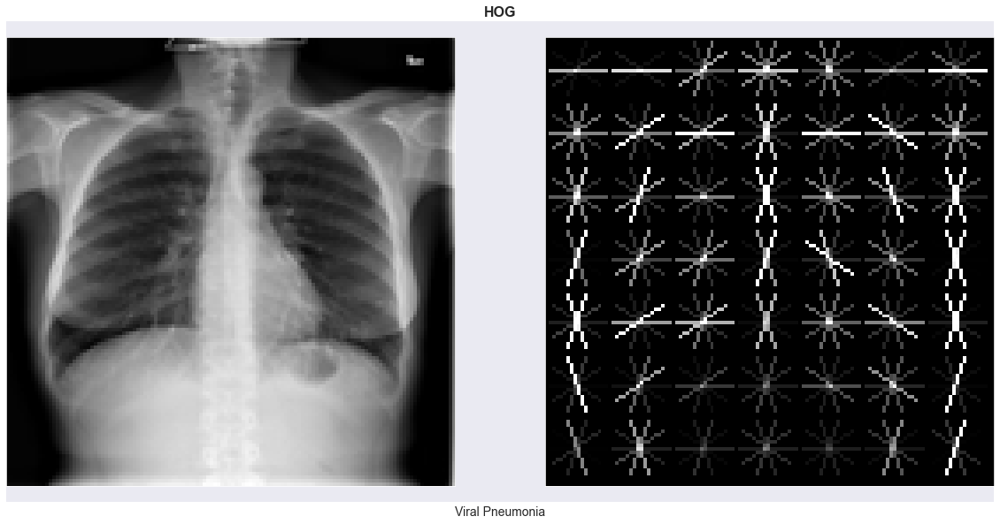

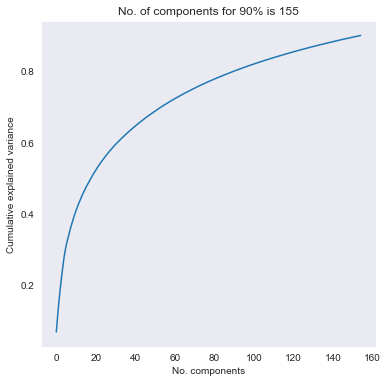

In [10]:
sample = sampleDf.iloc[0]

wh = 128

# Visualise HOG descriptors of 1st sample
img = np.asarray(Image.open(sample['img']).resize((wh, wh), Image.ANTIALIAS).convert('L'))
hogF, hogImg = hog(img, orientations=5, pixels_per_cell=(18, 18), cells_per_block=(2, 2), visualize=True)
print(hogF.shape)

fig = plt.figure(figsize=(20, 10))
plt.title('HOG', fontsize=16, weight='bold')
sns.despine(top=True, right=True, left=True, bottom=True)
plt.xlabel(dx, fontsize=14)
plt.xticks([])
plt.yticks([])
ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
ax.imshow(img, cmap=plt.cm.gray)
ax = fig.add_subplot(1, 2, 2, xticks=[], yticks=[])
ax.imshow(exposure.rescale_intensity(hogImg, in_range=(0, 10)), cmap=plt.cm.gray)

# Fit PCA and reduce dimensions of HOG (pkl/hog saved to reduce execution time)
os.makedirs(f"{ANALYSIS_DIRECTORY}/hog-pca/", exist_ok=True)

projected = None; pca = None
if not os.path.isfile(f"{ANALYSIS_DIRECTORY}/hog-pca/pca.pkl"):
  features = [ ]
  for i, row in imgDf.iterrows():
    imgT = np.asarray(Image.open(row['img']).resize((wh, wh), Image.ANTIALIAS).convert('L'))
    hogFT = hog(imgT, orientations=5, pixels_per_cell=(18, 18), cells_per_block=(2, 2))
    #hogImgT = exposure.rescale_intensity(hogImgT, in_range=(0, 10)) -> if we want to visualise a sample
    
    features.append(hogFT)

  features = np.array(features)

  # Standardise then fit
  scl = StandardScaler()
  pca = decomposition.PCA(n_components=0.9)
  projected = scl.fit_transform(features)
  projected = pca.fit_transform(projected)

  # dump pca
  pk.dump(pca, open(f"{ANALYSIS_DIRECTORY}/hog-pca/pca.pkl", 'wb'))

  # dump projected
  pd.DataFrame(projected).to_csv(f"{ANALYSIS_DIRECTORY}/hog-pca/projected.csv")
else:
  pca = pk.load(open(f"{ANALYSIS_DIRECTORY}/hog-pca/pca.pkl", 'rb'))
  projected = pd.read_csv(f"{ANALYSIS_DIRECTORY}/hog-pca/projected.csv")
  projected = projected.drop(projected.columns[[0]], axis=1).reset_index(drop=True).to_numpy()

# Plot explained variance
plt.figure(figsize=(6, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title(f"No. of components for 90% is {len(pca.components_)}")
plt.xlabel('No. components')
plt.ylabel('Cumulative explained variance')

##### Visualise principal components of HOG

<AxesSubplot:xlabel='pc', ylabel='var'>

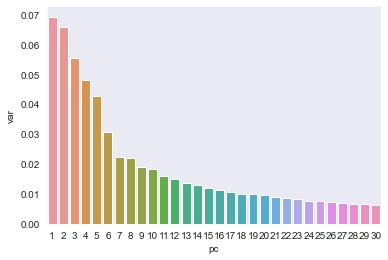

In [11]:
# Visualise principal components
tf = pd.DataFrame(projected, columns=[f"PC_{i+1}" for i, var in enumerate(pca.explained_variance_ratio_)])
tf['dx'] = imgDf['dx']

pcDf = pd.DataFrame({
  'pc': [f"{i+1}" for i in range(0, 30)],
  'var': pca.explained_variance_ratio_[:30]
})

sns.barplot(data=pcDf, x='pc', y='var')

##### What could our hyperplane look like?

In [12]:
labels = {
  str(i): f"PC_{i+1} ({var:.1f}%)" for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    projected,
    labels=labels,
    dimensions=range(0, 10),
    color=tf['dx']
)
fig.update_traces(diagonal_visible=False)

In [13]:
totalVar = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter_3d(
    projected, x=0, y=1, z=2, color=tf['dx'],
    title=f"Total Explained Variance: {totalVar:.2f}% by {len(pca.components_)} components",
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig.show()